In [1]:
from platform import python_version
print(python_version())

3.8.5


In [3]:
!pip list

Package                       Version
----------------------------- -------------------
aicsimageio                   3.3.4
aicspylibczi                  2.8.0
alabaster                     0.7.12
appdirs                       1.4.4
argon2-cffi                   20.1.0
astroid                       2.4.2
async-generator               1.10
attrs                         20.2.0
Babel                         2.9.0
backcall                      0.2.0
bleach                        3.2.1
brotlipy                      0.7.0
cachey                        0.2.1
certifi                       2020.12.5
cffi                          1.14.3
chardet                       3.0.4
click                         7.1.2
cloudpickle                   1.6.0
colorama                      0.4.3
comtypes                      1.1.7
cryptography                  3.2.1
cycler                        0.10.0
czifile                       2019.7.2
dask                          2021.3.0
decorator                     4.4.

In [1]:
import xlwings as xw
import numpy as np
import pandas as pd
import os, os.path
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from outliers import smirnov_grubbs as grubbs

In [3]:
savedic = 'C:/Users/User/Desktop/demo/boxplot'

## Plot Function

In [4]:
def Plot4_seaborn(in_data, name, unit, group):
    global savedic
    mydata = in_data
    # data = [temp_data_0X, temp_data_025X, temp_data_05X, temp_data_1X, temp_data_2X]
    # data = [grubbs.test(in_data[0], alpha=0.05), grubbs.test(in_data[1], alpha=0.05), 
    #         grubbs.test(in_data[2], alpha=0.05), grubbs.test(in_data[3], alpha=0.05)]
    max_value = np.amax([np.amax(mydata[0]), np.amax(mydata[1]), np.amax(mydata[2]), np.amax(mydata[3])])
    numBoxes = 4  
    fig1, ax1 = plt.subplots(figsize=(6, 9), dpi=600)
    sns.boxplot(data = mydata, linewidth=3, showfliers=False)
    sns.swarmplot(data = mydata, color=".25", size=6)
    if (name == "Average Branch Length") or (name == "Branch Length Per Mito"):
        ax1.set_title(name, size = 24, fontweight='bold') 
    elif name == "Max Area / Total Area":
        ax1.set_title(name, size = 24, fontweight='bold')
    else :
        ax1.set_title(name, size = 34, fontweight='bold') 
    
    #ax1.set_aspect(3/max_value)
    if unit == 'area':
        plt.ylabel("Area ($\mathbf{\mu m^2}$)", size = 20, fontweight='bold', labelpad=10)
    elif unit == 'length':
        plt.ylabel("Length ($\mathbf{\mu m}$)", size = 20, fontweight='bold', labelpad=10)
    elif unit == 'count':
        plt.ylabel("Count", size = 20, fontweight='bold', labelpad=10)
    elif unit == 'a.u.':
        plt.ylabel("a.u.", size = 20, fontweight='bold', labelpad=10)
    elif unit == 'ratio':
        plt.ylabel("Ratio (a.u.)", size = 20, fontweight='bold', labelpad=10)
    elif unit == 'normalized count':
        plt.ylabel("1 / $\mathbf{\mu m^2}$", size = 20, fontweight='bold', labelpad=10)
    #plt.yticks(size = 25, fontweight='bold')
    plt.xticks([0., 1., 2., 3.], ["Control", "FCCP", "Oligomycin", "Rotenone"], size = 20, fontweight='bold', rotation=30, ha='right')
    plt.yticks(size = 25, fontweight='bold')
              
    print(f'Levena for {name} = {stats.levene(mydata[0], mydata[1], mydata[2], mydata[3])}')
    print(f'ANOVA for {name} = {stats.f_oneway(mydata[0], mydata[1], mydata[2], mydata[3])}') 
    
    # 0 vs 1
    if round(stats.ttest_ind(mydata[0], mydata[1], equal_var = False).pvalue, 4) <= 0.05:
        bar_start = max_value * 1.04
        barh = max_value * 0.02
        left_x = 0
        right_x = 0.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[0], mydata[1], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[0], mydata[1], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs)
    
    # 1 vs 2
    if round(stats.ttest_ind(mydata[1], mydata[2], equal_var = False).pvalue, 4) <= 0.05:
        bar_start = max_value * 1.04
        barh = max_value * 0.02
        left_x = 1.05
        right_x = 1.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[1], mydata[2], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[1], mydata[2], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs)
    
    # 2 vs 3
    if round(stats.ttest_ind(mydata[2], mydata[3], equal_var = False).pvalue, 4) <= 0.05:
        bar_start = max_value * 1.04
        barh = max_value * 0.02
        left_x = 2.05
        right_x = 2.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[2], mydata[3], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[2], mydata[3], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs)   

    # 0 vs 2
    if round(stats.ttest_ind(mydata[0], mydata[2], equal_var = False).pvalue, 4) <= 0.05:  
        bar_start = max_value * 1.12
        barh = max_value * 0.02
        left_x = 0
        right_x = 1.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[0], mydata[2], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[0], mydata[2], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs) 

    # 1 vs 3
    if round(stats.ttest_ind(mydata[1], mydata[3], equal_var = False).pvalue, 4) <= 0.05:  
        bar_start = max_value * 1.20
        barh = max_value * 0.02
        left_x = 1
        right_x = 2.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[1], mydata[3], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[1], mydata[3], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs) 
            
            
    # 0 vs 3
    if round(stats.ttest_ind(mydata[0], mydata[3], equal_var = False).pvalue, 4) <= 0.05:  
        bar_start = max_value * 1.28
        barh = max_value * 0.02
        left_x = 0
        right_x = 2.95
        barx = [left_x, left_x, right_x, right_x]
        bary = [bar_start, bar_start+barh, bar_start+barh, bar_start]
        mid = ((left_x+right_x)/2, bar_start+barh)
        plt.plot(barx, bary, c='black', linewidth=5) 
        kwargs = dict(ha='center', va='bottom', fontsize='20', fontweight='bold')
        if round(stats.ttest_ind(mydata[0], mydata[3], equal_var = False).pvalue, 4) <= 0.001:
            plt.text(*mid, "***", **kwargs)
        elif round(stats.ttest_ind(mydata[0], mydata[3], equal_var = False).pvalue, 4) <= 0.01:
            plt.text(*mid, "**", **kwargs)
        else: 
            plt.text(*mid, "*", **kwargs)
            
    plt.tight_layout() 
    if name == "Max Area / Total Area" :
        plt.savefig(f'{savedic}/{group}/MaxTotal.tif', dpi=600)
    elif name == "Deg 1 / Deg 3":
        plt.savefig(f'{savedic}/{group}/Deg1_to_Deg3.tif', dpi=600)
    else:
        plt.savefig(f'{savedic}/{group}/{name}.tif', dpi=600)
    plt.show()

### Data from Analyze Particle Summary

In [5]:
# define the directory of the csv 
# APS = Analyze Particle Summary
APS_0X_dir = './data/Analyze_Particle_Summary/Control'
APS_05X_dir = './data/Analyze_Particle_Summary/FCCP'
APS_1X_dir = './data/Analyze_Particle_Summary/Oligomycin'
APS_2X_dir = './data/Analyze_Particle_Summary/Rotenone'

In [7]:
# get the filename list
file_name_APS_0X = []
file_name_APS_05X = []
file_name_APS_1X = []
file_name_APS_2X = []
for filename in os.listdir(APS_0X_dir):
    if filename.endswith(".csv"):
        file_name_APS_0X.append(filename)       
for filename in os.listdir(APS_05X_dir):
    if filename.endswith(".csv"):
        file_name_APS_05X.append(filename)
for filename in os.listdir(APS_1X_dir):
    if filename.endswith(".csv"):
        file_name_APS_1X.append(filename)
for filename in os.listdir(APS_2X_dir):
    if filename.endswith(".csv"):
        file_name_APS_2X.append(filename)

In [8]:
tox = ["Control", "FCCP", "Oligomycin", "Rotenone"]
file_name_APS_list = [file_name_APS_0X, file_name_APS_05X, file_name_APS_1X, file_name_APS_2X]
Count = [[],[],[],[]]
nCount = [[],[],[],[]]
TotalArea = [[],[],[],[]]
AverageArea = [[],[],[],[]]
Perimeter = [[],[],[],[]]
FormFactor = [[],[],[],[]]

for i in range(len(tox)):
    for j in range(len(file_name_APS_list[i])):
        df = pd.read_csv(f'./data/Analyze_Particle_Summary/{tox[i]}/{file_name_APS_list[i][j]}', index_col=0)
        Count[i].append(float(df['Count']))
        TotalArea[i].append(float(df['Total Area']))
        AverageArea[i].append(float(df['Average Size']))
        Perimeter[i].append(float(df['Perim.']))
        FormFactor[i].append(np.reciprocal(float(df['Circ.'])))
        nCount[i].append(float(df['Count'])/float(df['Total Area']))

### Data from Analyze Particle Results

In [9]:
# define the directory of the csv 
# APR = Analyze Particle Results
APR_0X_dir = './data/Analyze_Particle_Results/Control'
APR_05X_dir = './data/Analyze_Particle_Results/FCCP'
APR_1X_dir = './data/Analyze_Particle_Results/Oligomycin'
APR_2X_dir = './data/Analyze_Particle_Results/Rotenone'

# get the filename list
file_name_APR_0X = []
file_name_APR_05X = []
file_name_APR_1X = []
file_name_APR_2X = []

for filename in os.listdir(APR_0X_dir):
    if filename.endswith(".csv"):
        file_name_APR_0X.append(filename)
for filename in os.listdir(APR_05X_dir):
    if filename.endswith(".csv"):
        file_name_APR_05X.append(filename)
for filename in os.listdir(APR_1X_dir):
    if filename.endswith(".csv"):
        file_name_APR_1X.append(filename)
for filename in os.listdir(APR_2X_dir):
    if filename.endswith(".csv"):
        file_name_APR_2X.append(filename)

In [10]:
tox = ["Control", "FCCP", "Oligomycin", "Rotenone"]
file_name_APR_list = [file_name_APR_0X, file_name_APR_05X, file_name_APR_1X, file_name_APR_2X]
AspectRatio = [[],[],[],[]]
MaxArea = [[],[],[],[]]

for i in range(len(tox)):
    for j in range(len(file_name_APS_list[i])):
        df = pd.read_csv(f'./data/Analyze_Particle_Results/{tox[i]}/{file_name_APR_list[i][j]}', index_col=0)
        AspectRatio[i].append(df['AR'].mean())
        MaxArea[i].append(df.loc[df['Area'].idxmax()]['Area'])

In [11]:
total_area_0X_np = np.array(TotalArea[0])
total_area_05X_np = np.array(TotalArea[1])
total_area_1X_np = np.array(TotalArea[2])
total_area_2X_np = np.array(TotalArea[3])

max_area_0X_np = np.array(MaxArea[0])
max_area_05X_np = np.array(MaxArea[1])
max_area_1X_np = np.array(MaxArea[2])
max_area_2X_np = np.array(MaxArea[3])

temp_data_0X = max_area_0X_np/total_area_0X_np
temp_data_05X = max_area_05X_np/total_area_05X_np
temp_data_1X = max_area_1X_np/total_area_1X_np
temp_data_2X = max_area_2X_np/total_area_2X_np
MaxTotal = [temp_data_0X, temp_data_05X, temp_data_1X, temp_data_2X]

### Data From Skeleton Results

In [12]:
# define the directory of the csv 
# APR = Analyze Particle Results
SR_0X_dir = './data/Skeleton_Results/Control'   
SR_05X_dir = './data/Skeleton_Results/FCCP' 
SR_1X_dir = './data/Skeleton_Results/Oligomycin' 
SR_2X_dir = './data/Skeleton_Results/Rotenone'

# get the filename list
file_name_SR_0X = []
file_name_SR_05X = []
file_name_SR_1X = []
file_name_SR_2X = []

for filename in os.listdir(SR_0X_dir):
    if filename.endswith(".csv"):
        file_name_SR_0X.append(filename)
for filename in os.listdir(SR_05X_dir):
    if filename.endswith(".csv"):
        file_name_SR_05X.append(filename)
for filename in os.listdir(SR_1X_dir):
    if filename.endswith(".csv"):
        file_name_SR_1X.append(filename)
for filename in os.listdir(SR_2X_dir):
    if filename.endswith(".csv"):
        file_name_SR_2X.append(filename)

tox = ["Control", "FCCP", "Oligomycin", "Rotenone"]
file_name_SR_list = [file_name_SR_0X, file_name_SR_05X, file_name_SR_1X, file_name_SR_2X]

TotalBranches = [[],[],[],[]]
AvgBranches = [[],[],[],[]]
ABL = [[],[],[],[]]
BLpM = [[],[],[],[]]
TotalDeg1 = [[],[],[],[]]
TotalDeg2 = [[],[],[],[]]
TotalDeg3 = [[],[],[],[]]
AvgDeg1 = [[],[],[],[]]
AvgDeg2 = [[],[],[],[]]
AvgDeg3 = [[],[],[],[]]
AvgDeg = [[],[],[],[]]




for i in range(len(tox)):
    for j in range(len(file_name_SR_list[i])):
        df = pd.read_csv(f'./data/Skeleton_Results/{tox[i]}/{file_name_SR_list[i][j]}', index_col=0)
        # Calculate deg 2
        fake_deg2 = np.zeros(df[df.columns[0]].count())
        deg2 = np.zeros(df[df.columns[0]].count())
        real_ABL = np.sum(df['# Branches'] * df['Average Branch Length']) / np.sum(df['# Branches'])
        for k in range(len(deg2)):
            fake_deg2[k] = (df['# Branches'][k+1] * df['Average Branch Length'][k+1]) / real_ABL
            dif = round(fake_deg2[k] - (df['# End-point voxels'][k+1] + df['# Junctions'][k+1])) # dif = #2 - (#1 + #3), 0)
            if dif <= 0:
                deg2[k] = 0
            elif dif > 0 :
                deg2[k] = dif
        df['fake_Deg2'] = fake_deg2
        df['Deg2'] = deg2
        
        TotalBranches[i].append(df['# Branches'].sum())
        AvgBranches[i].append(df['# Branches'].mean())
        ABL[i].append(df['Average Branch Length'].mean())
        BLpM[i].append((df['# Branches'] * df['Average Branch Length']).mean())
        TotalDeg1[i].append(df['# End-point voxels'].sum())
        TotalDeg2[i].append(df['Deg2'].sum())
        TotalDeg3[i].append(df['# Junctions'].sum())
        AvgDeg1[i].append(df['# End-point voxels'].mean())
        AvgDeg2[i].append(df['Deg2'].mean())
        AvgDeg3[i].append(df['# Junctions'].mean())
        avgdeg = (df['# End-point voxels'].sum() + 2*df['Deg2'].sum() + 3*df['# Junctions'].sum()) / (df['# End-point voxels'].sum() + df['Deg2'].sum() + df['# Junctions'].sum())
        AvgDeg[i].append(avgdeg)
        
TotalDeg1_0X_np = np.array(TotalDeg1[0])
TotalDeg1_05X_np = np.array(TotalDeg1[1])
TotalDeg1_1X_np = np.array(TotalDeg1[2])
TotalDeg1_2X_np = np.array(TotalDeg1[3])

TotalDeg2_0X_np = np.array(TotalDeg2[0])
TotalDeg2_05X_np = np.array(TotalDeg2[1])
TotalDeg2_1X_np = np.array(TotalDeg2[2])
TotalDeg2_2X_np = np.array(TotalDeg2[3])

TotalDeg3_0X_np = np.array(TotalDeg3[0])
TotalDeg3_05X_np = np.array(TotalDeg3[1])
TotalDeg3_1X_np = np.array(TotalDeg3[2])
TotalDeg3_2X_np = np.array(TotalDeg3[3])

# Deg1_to_Deg3
temp_data_0X = TotalDeg1_0X_np/TotalDeg3_0X_np
temp_data_05X = TotalDeg1_05X_np/TotalDeg3_05X_np
temp_data_1X = TotalDeg1_1X_np/TotalDeg3_1X_np
temp_data_2X = TotalDeg1_2X_np/TotalDeg3_2X_np
Deg1_to_Deg3 = [temp_data_0X, temp_data_05X, temp_data_1X, temp_data_2X]

# nDeg1
temp_data_0X = TotalDeg1_0X_np/total_area_0X_np
temp_data_05X = TotalDeg1_05X_np/total_area_05X_np
temp_data_1X = TotalDeg1_1X_np/total_area_1X_np
temp_data_2X = TotalDeg1_2X_np/total_area_2X_np
nDeg1 = [temp_data_0X, temp_data_05X, temp_data_1X, temp_data_2X]

#nDeg2
temp_data_0X = TotalDeg2_0X_np/total_area_0X_np
temp_data_05X = TotalDeg2_05X_np/total_area_05X_np
temp_data_1X = TotalDeg2_1X_np/total_area_1X_np
temp_data_2X = TotalDeg2_2X_np/total_area_2X_np
nDeg2 = [temp_data_0X, temp_data_05X, temp_data_1X, temp_data_2X]

#nDeg3
temp_data_0X = TotalDeg3_0X_np/total_area_0X_np
temp_data_05X = TotalDeg3_05X_np/total_area_05X_np
temp_data_1X = TotalDeg3_1X_np/total_area_1X_np
temp_data_2X = TotalDeg3_2X_np/total_area_2X_np
nDeg3 = [temp_data_0X, temp_data_05X, temp_data_1X, temp_data_2X]

<ipython-input-12-a19460da3a1f>:93: RuntimeWarning: divide by zero encountered in true_divide
  temp_data_1X = TotalDeg1_1X_np/TotalDeg3_1X_np


Levena for Count = LeveneResult(statistic=1.7504105090311988, pvalue=0.197101629543522)
ANOVA for Count = F_onewayResult(statistic=1.0793220338983054, pvalue=0.38593081788788397)


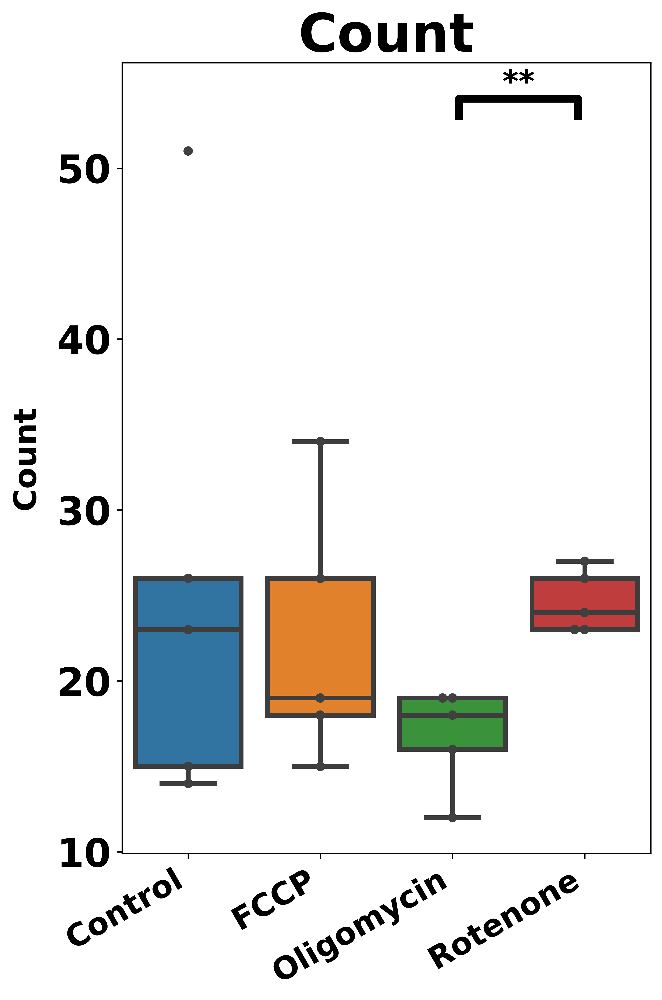

Levena for Normalized Count = LeveneResult(statistic=1.7441815388349655, pvalue=0.19831095992172623)
ANOVA for Normalized Count = F_onewayResult(statistic=8.914051873065855, pvalue=0.0010510883300402652)


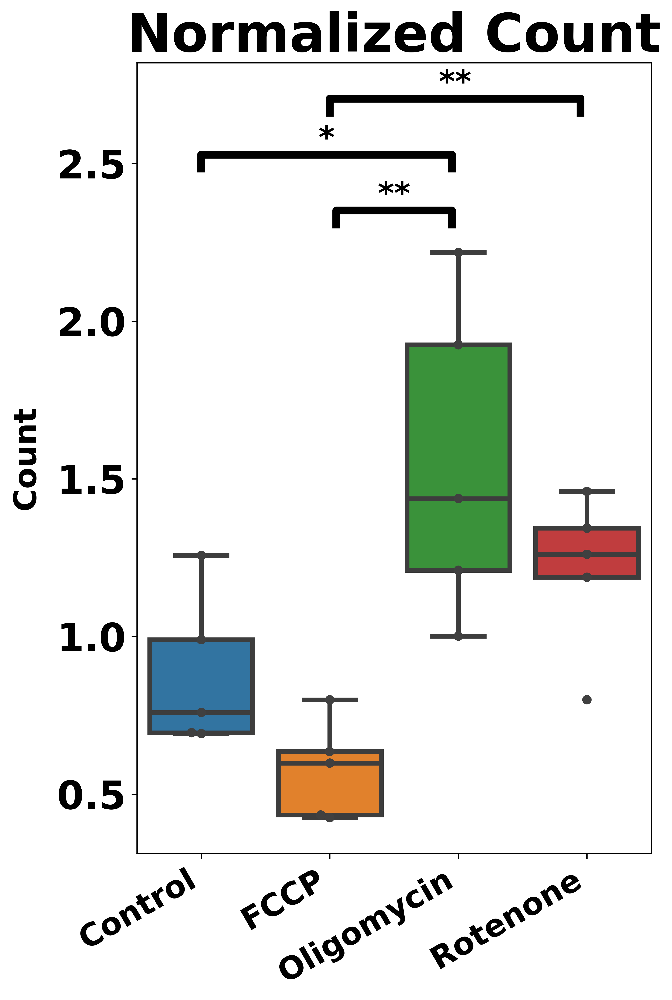

Levena for Total Area = LeveneResult(statistic=0.623033128024232, pvalue=0.6103568688780753)
ANOVA for Total Area = F_onewayResult(statistic=8.587303762625796, pvalue=0.001257996227497076)


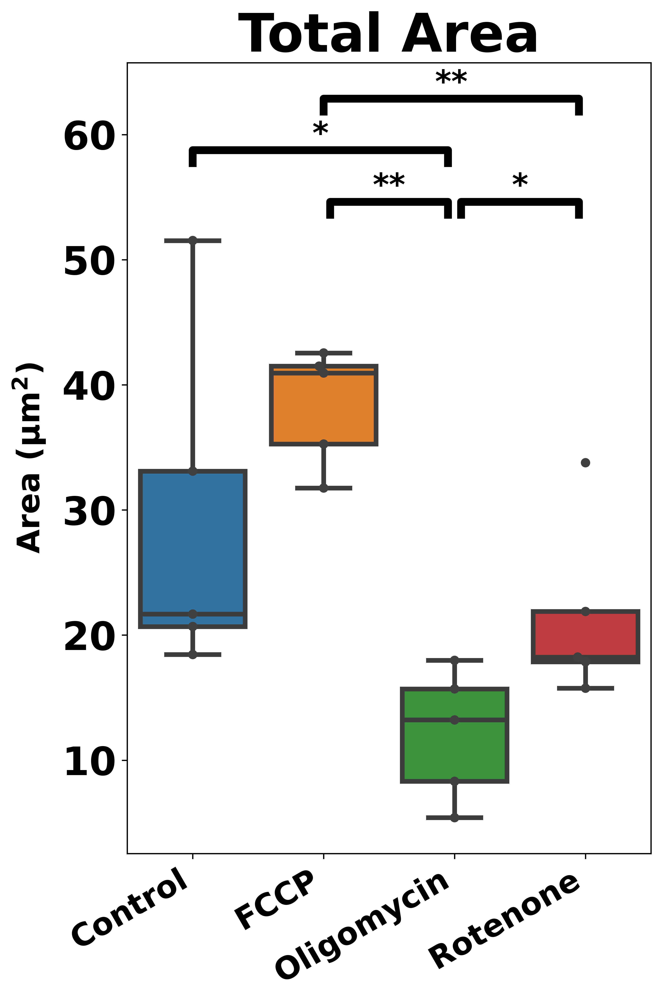

Levena for Average Area = LeveneResult(statistic=1.1324776385353623, pvalue=0.3656934419425621)
ANOVA for Average Area = F_onewayResult(statistic=12.12443072074634, pvalue=0.0002161399587348775)


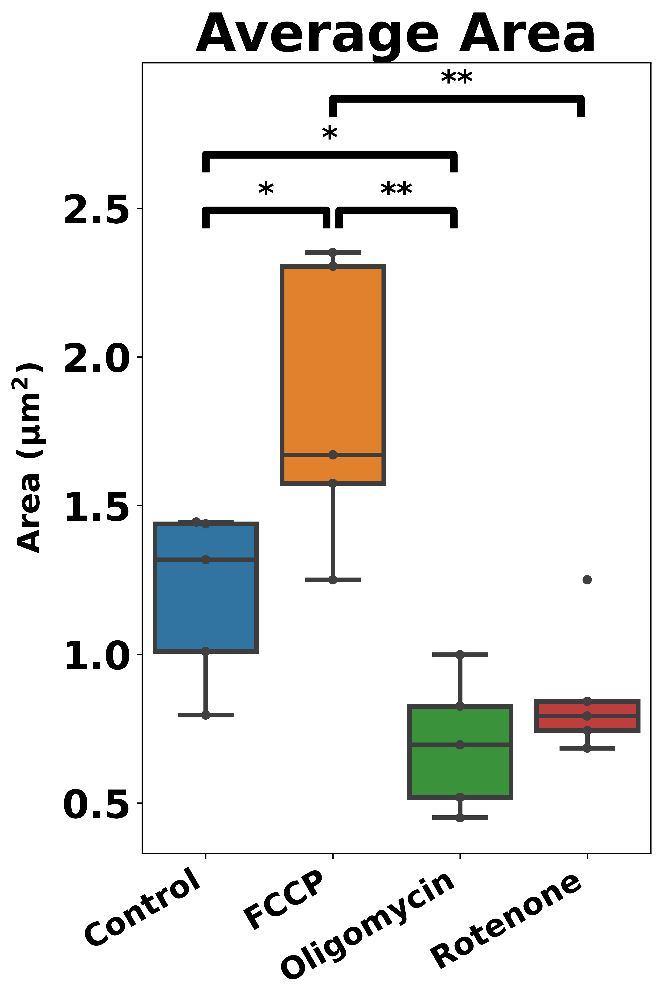

Levena for Perimeter = LeveneResult(statistic=1.1892011450068458, pvalue=0.3452829451736475)
ANOVA for Perimeter = F_onewayResult(statistic=12.857285167537785, pvalue=0.00015671512783627843)


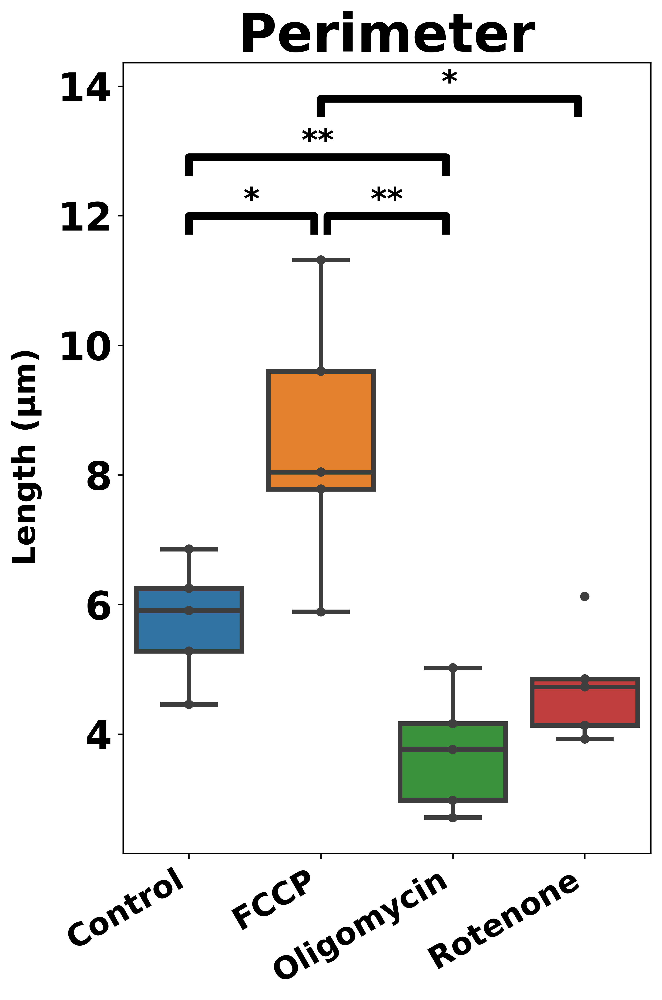

Levena for Form Factor = LeveneResult(statistic=2.623563491926086, pvalue=0.08620477299929782)
ANOVA for Form Factor = F_onewayResult(statistic=10.182029616691553, pvalue=0.0005421689450447242)


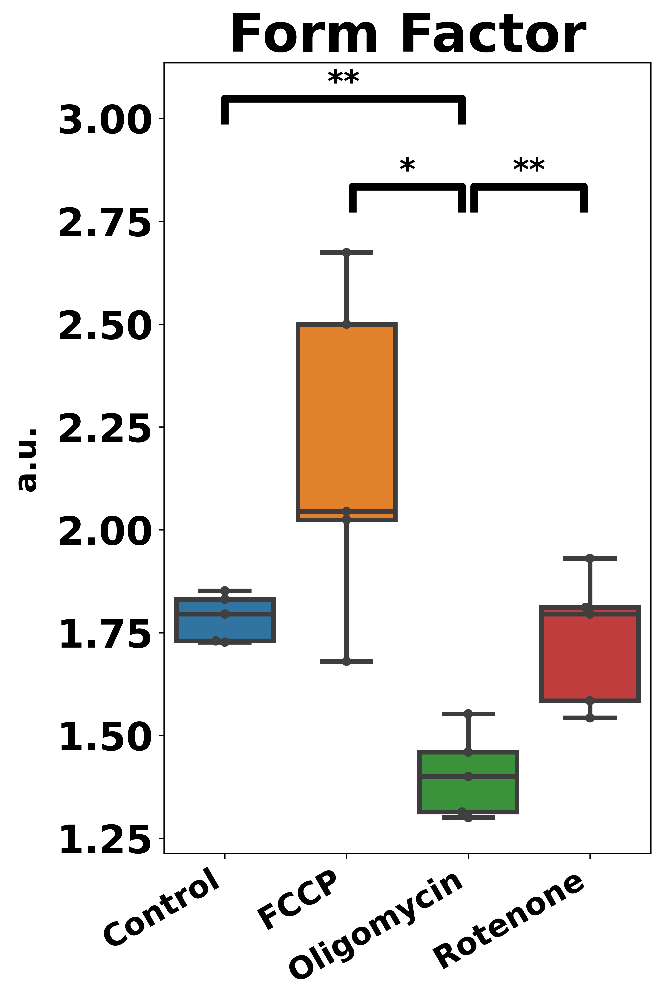

Levena for Aspect Ratio = LeveneResult(statistic=1.5100533455155143, pvalue=0.2500538615832209)
ANOVA for Aspect Ratio = F_onewayResult(statistic=12.987917644482893, pvalue=0.00014818227411488765)


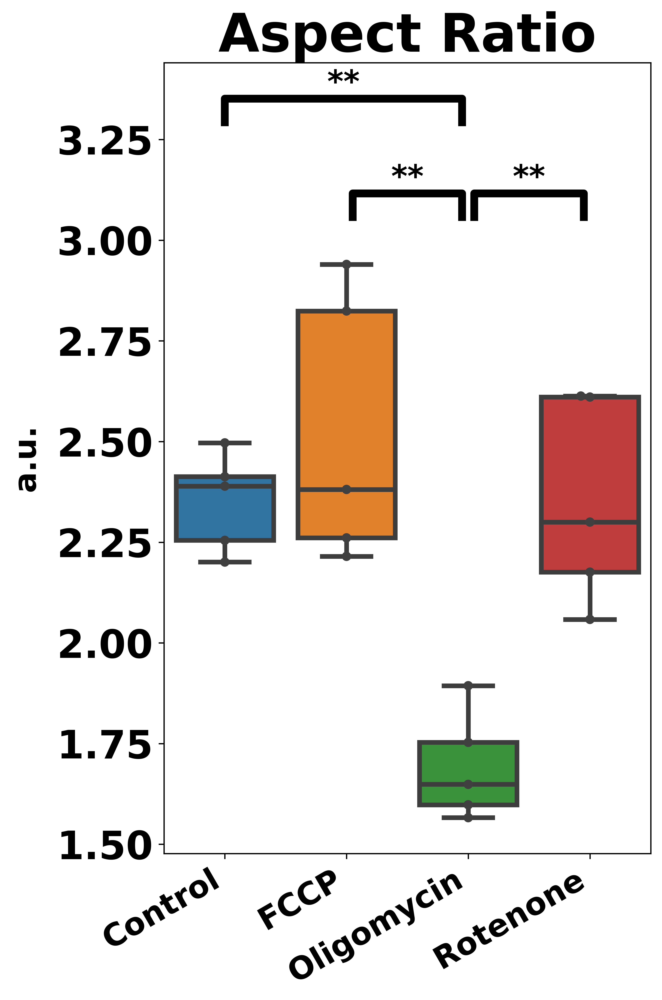

Levena for Max Area / Total Area = LeveneResult(statistic=2.2588976939629215, pvalue=0.12084394065842356)
ANOVA for Max Area / Total Area = F_onewayResult(statistic=1.3884522885108213, pvalue=0.2824259599469668)


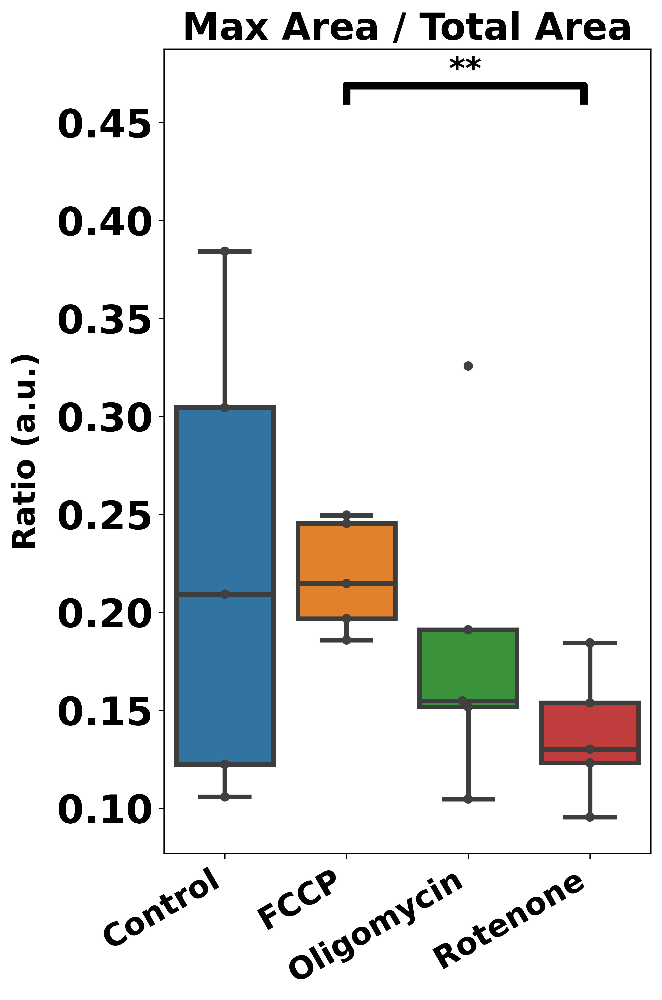

In [13]:
Plot4_seaborn(Count, "Count", unit = "count", group = "particle")
Plot4_seaborn(nCount, "Normalized Count", unit = "count", group = "particle")
Plot4_seaborn(TotalArea, "Total Area", unit = "area", group = "particle")
Plot4_seaborn(AverageArea, "Average Area", unit = "area", group = "particle")
Plot4_seaborn(Perimeter, "Perimeter", unit = "length", group = "particle")
Plot4_seaborn(FormFactor, "Form Factor", unit = "a.u.", group = "particle")
Plot4_seaborn(AspectRatio, "Aspect Ratio", unit = "a.u.", group = "particle")
Plot4_seaborn(MaxTotal, "Max Area / Total Area", unit = "ratio", group = "particle")

Levena for Total Branches = LeveneResult(statistic=0.7369977499196397, pvalue=0.5451902288178871)
ANOVA for Total Branches = F_onewayResult(statistic=8.473571646807212, pvalue=0.0013404527296230289)


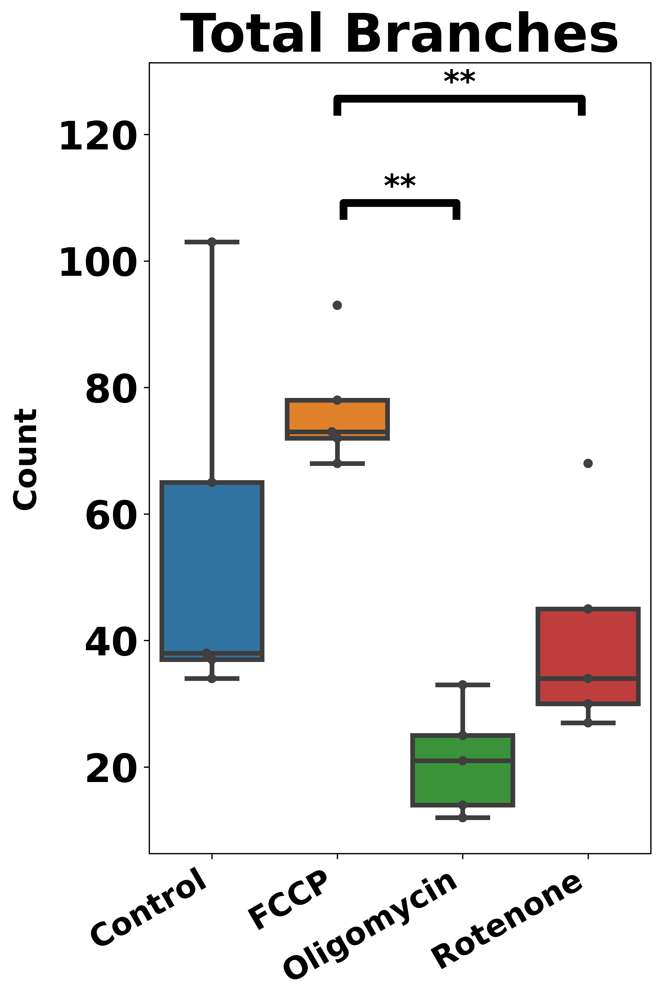

Levena for Average Branches = LeveneResult(statistic=2.8510524483911905, pvalue=0.07022307451164053)
ANOVA for Average Branches = F_onewayResult(statistic=10.168960762647558, pvalue=0.0005457346325281314)


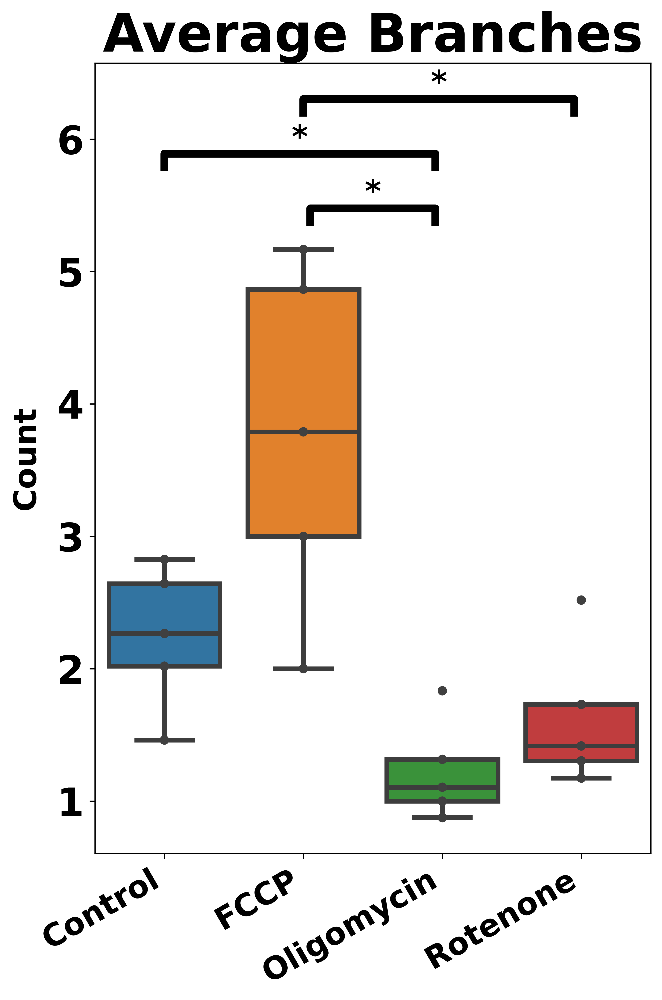

Levena for Average Branch Length = LeveneResult(statistic=0.6071192184287755, pvalue=0.6199521679779989)
ANOVA for Average Branch Length = F_onewayResult(statistic=14.600619136405212, pvalue=7.65162262508971e-05)


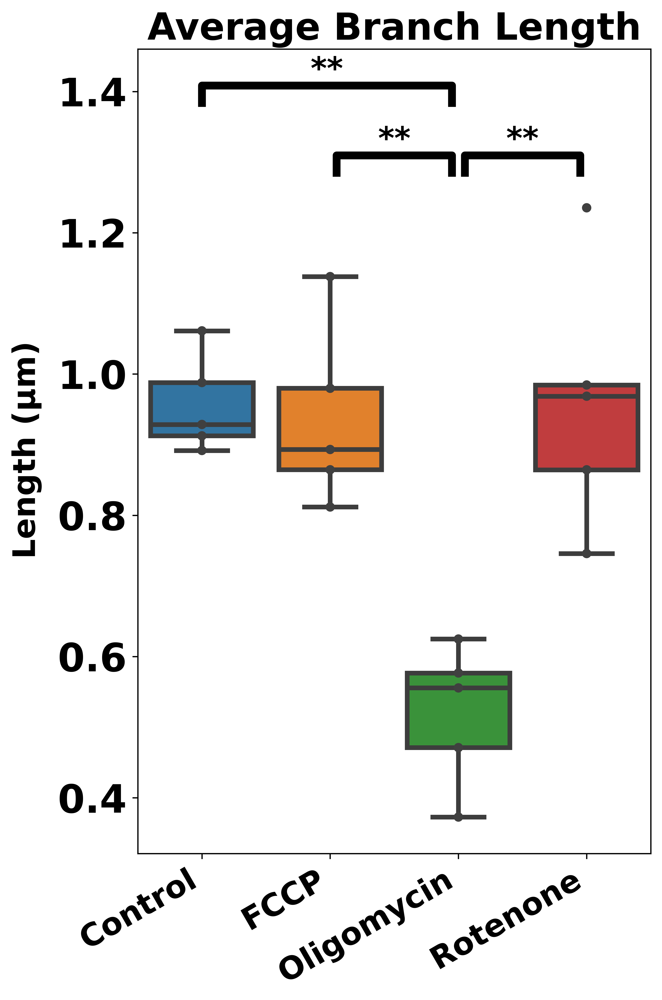

Levena for Branch Length Per Mito = LeveneResult(statistic=1.3221894376666867, pvalue=0.30189226500487604)
ANOVA for Branch Length Per Mito = F_onewayResult(statistic=13.92411071575359, pvalue=0.00010030261087838689)


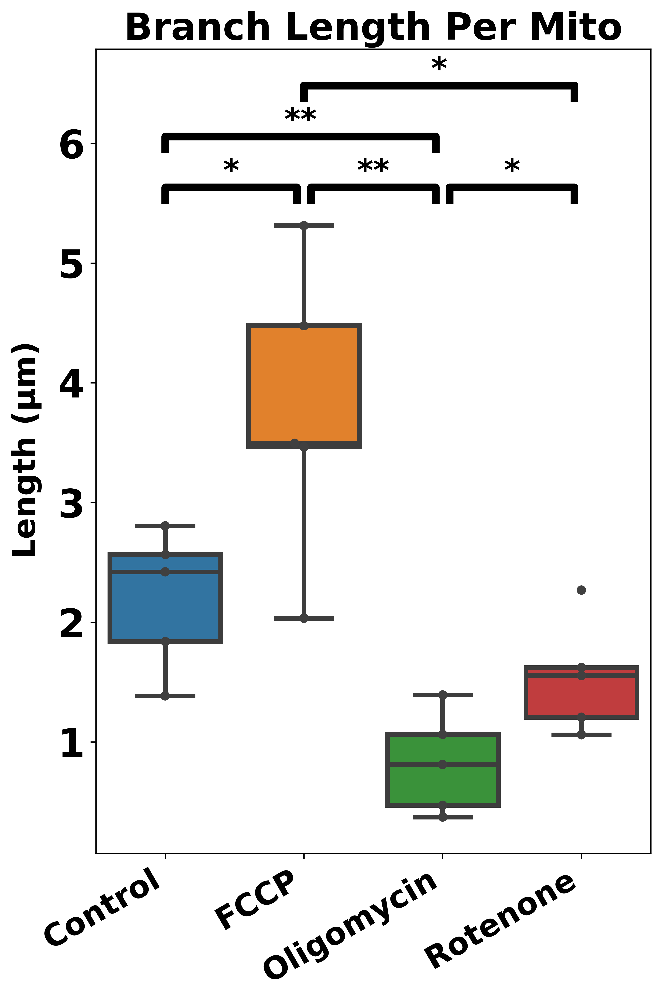

Levena for Total Deg 1 = LeveneResult(statistic=1.593555285182318, pvalue=0.2301144372715219)
ANOVA for Total Deg 1 = F_onewayResult(statistic=2.57821868961533, pvalue=0.08984781208839446)


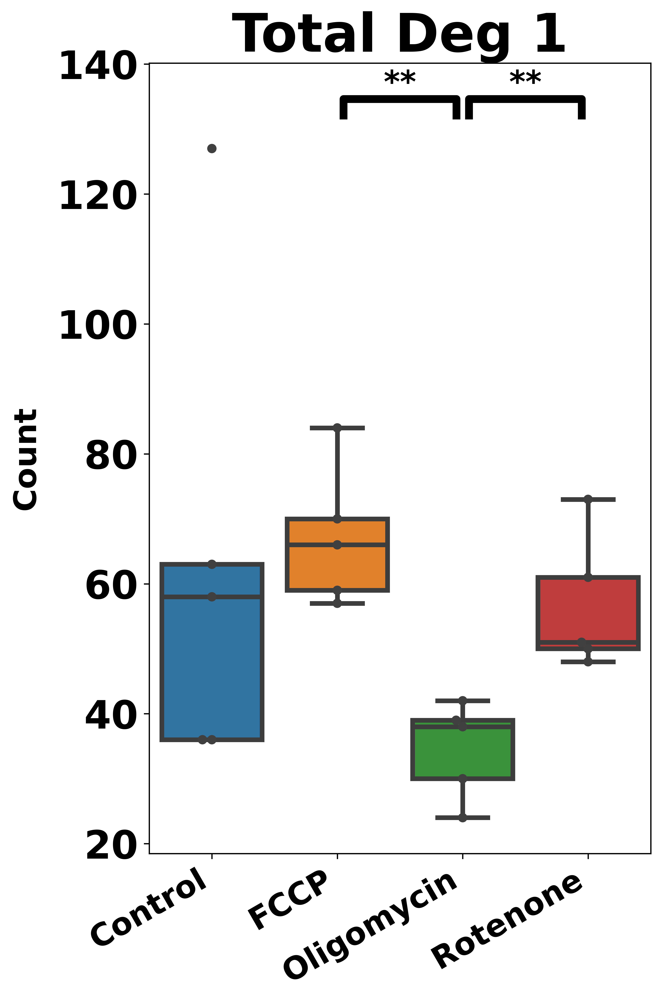

Levena for Total Deg 2 = LeveneResult(statistic=0.49134199134199136, pvalue=0.6932392740025866)
ANOVA for Total Deg 2 = F_onewayResult(statistic=2.898894154818325, pvalue=0.06729632619561669)


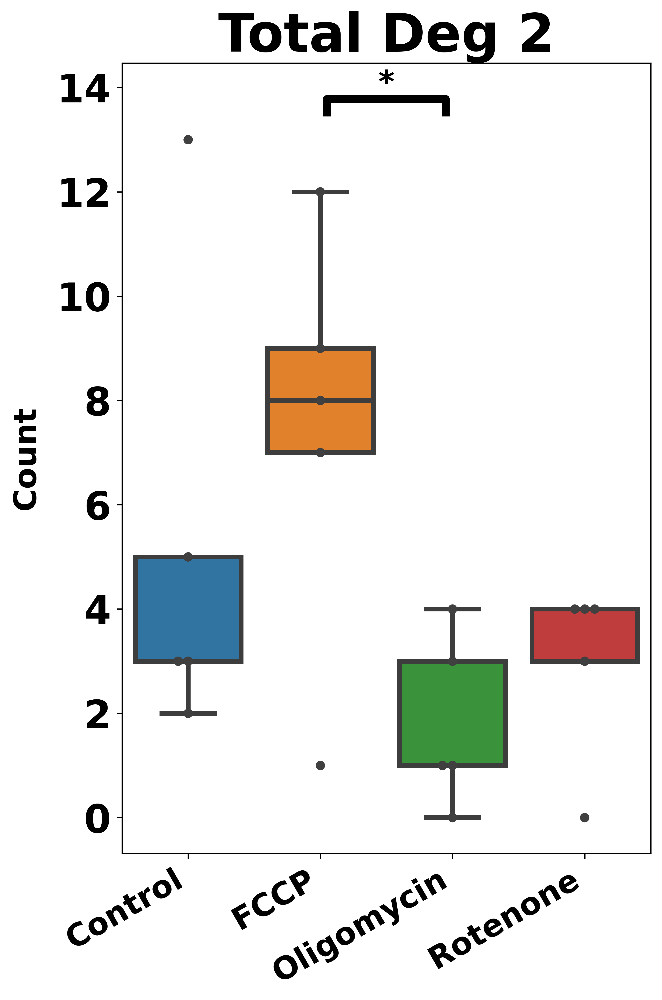

Levena for Total Deg 3 = LeveneResult(statistic=0.4428571428571428, pvalue=0.7255980714210172)
ANOVA for Total Deg 3 = F_onewayResult(statistic=11.44002466851681, pvalue=0.0002953554020032331)


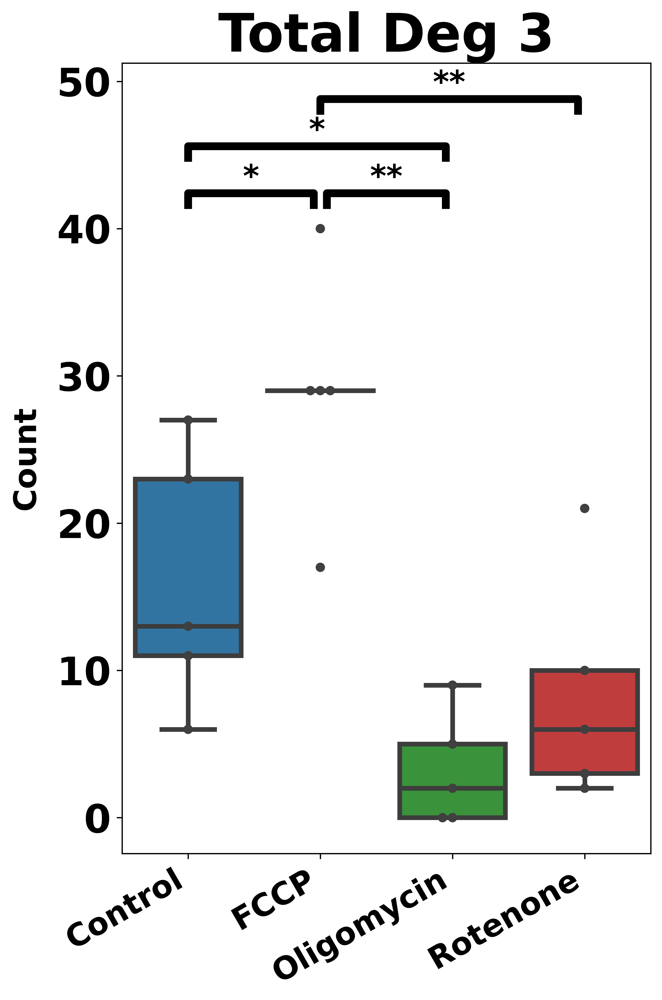

Levena for Average Deg 1 = LeveneResult(statistic=3.5186876700781458, pvalue=0.03942987477895593)
ANOVA for Average Deg 1 = F_onewayResult(statistic=9.431728166278365, pvalue=0.0007969267652418919)


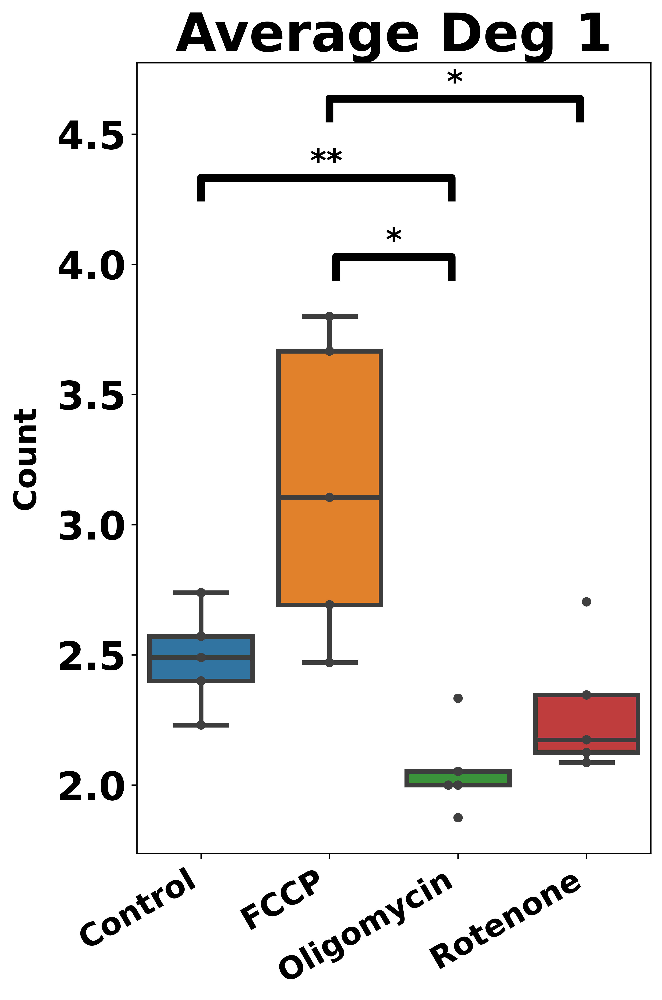

Levena for Average Deg 2 = LeveneResult(statistic=1.4484429177502371, pvalue=0.2659362523116943)
ANOVA for Average Deg 2 = F_onewayResult(statistic=3.5471466571966492, pvalue=0.03850219647485371)


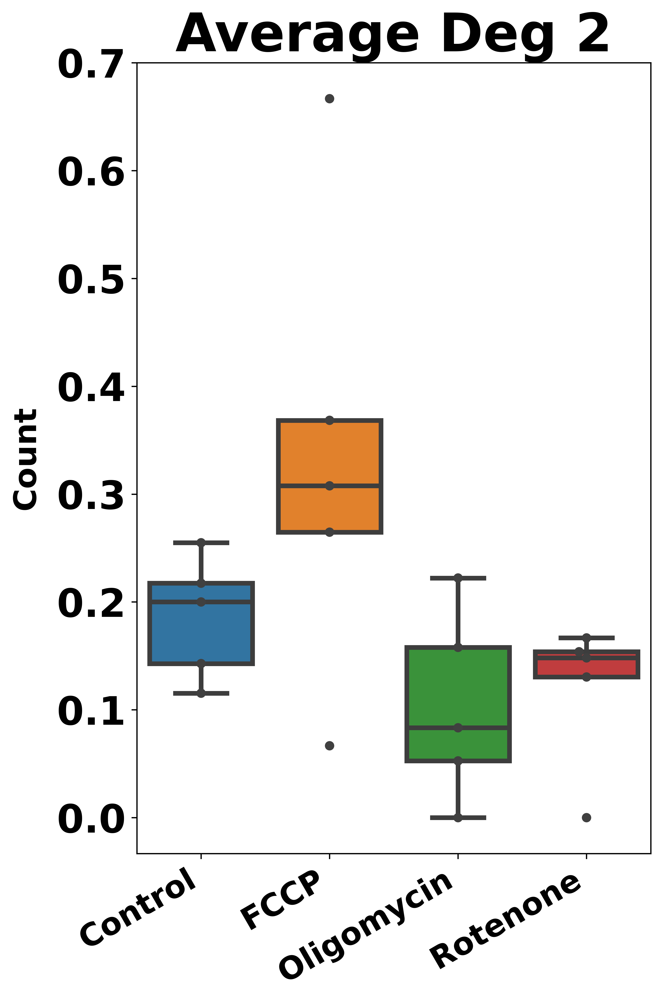

Levena for Average Deg 3 = LeveneResult(statistic=2.1813361823892126, pvalue=0.13003157293824893)
ANOVA for Average Deg 3 = F_onewayResult(statistic=9.650968131584529, pvalue=0.0007107419929840087)


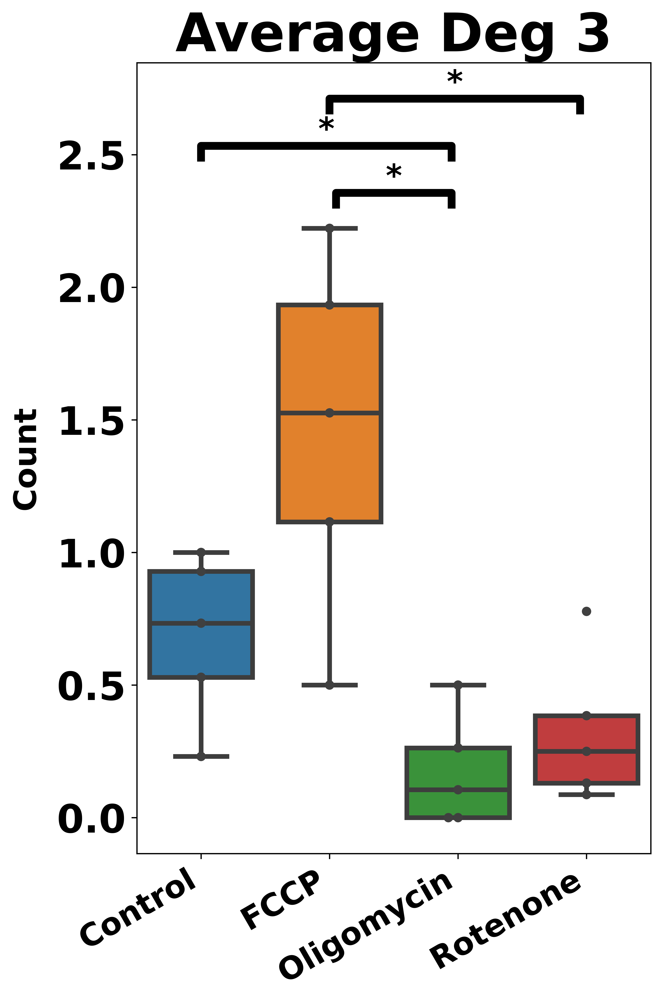

Levena for Normalized Deg 1 = LeveneResult(statistic=1.973945566451129, pvalue=0.1585597595613435)
ANOVA for Normalized Deg 1 = F_onewayResult(statistic=6.784793133658789, pvalue=0.0036645359070029853)


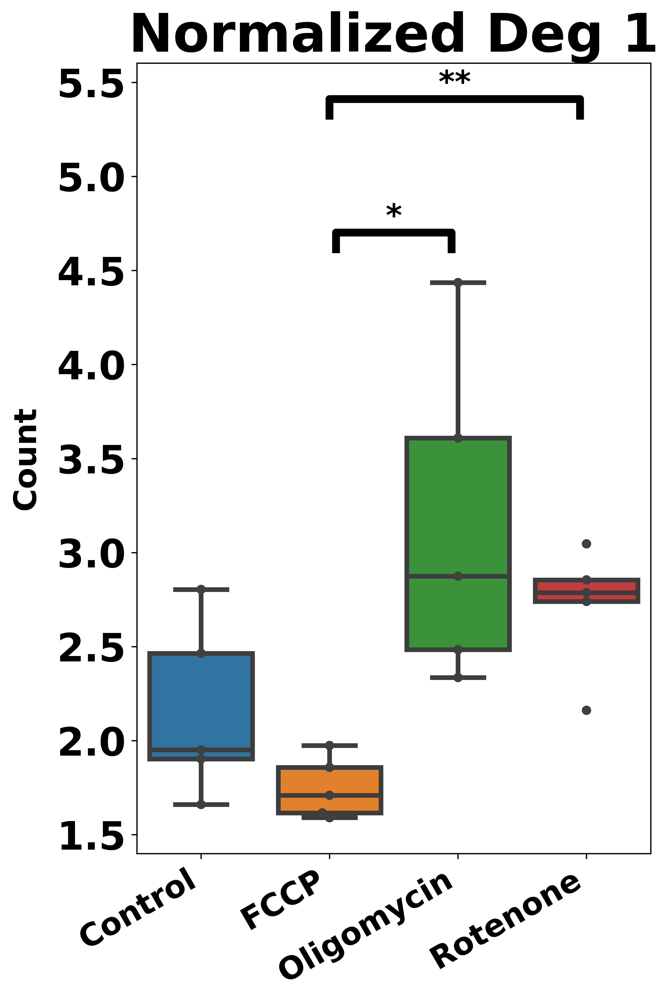

Levena for Normalized Deg 2 = LeveneResult(statistic=0.3766468588184182, pvalue=0.7710690489314744)
ANOVA for Normalized Deg 2 = F_onewayResult(statistic=0.33124470934405964, pvalue=0.8028702370783733)


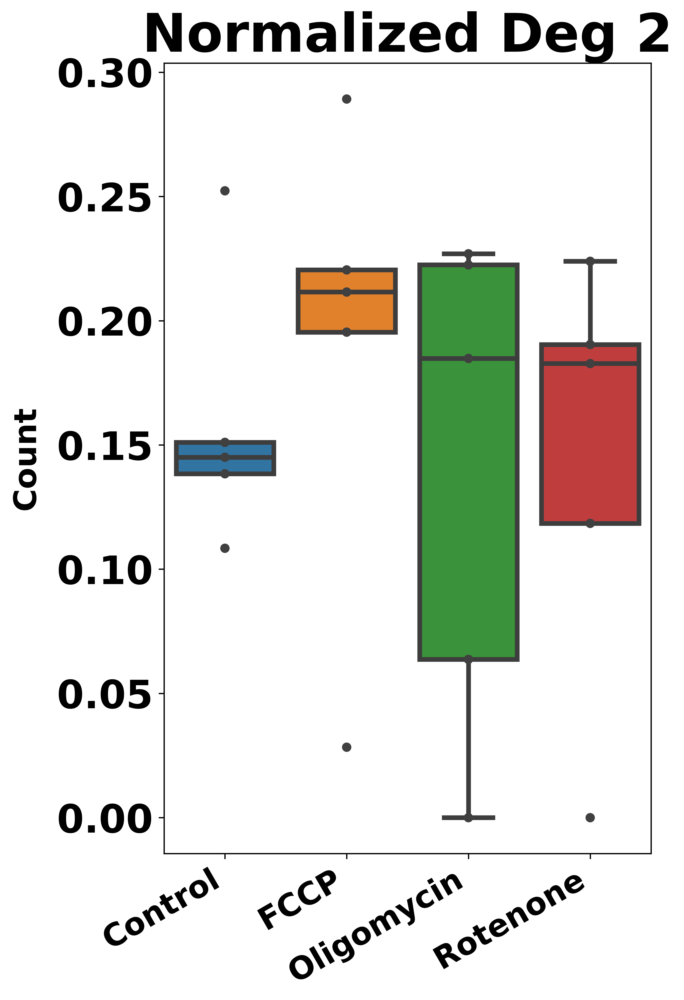

Levena for Normalized Deg 3 = LeveneResult(statistic=0.11935687394051513, pvalue=0.9473960977281722)
ANOVA for Normalized Deg 3 = F_onewayResult(statistic=7.252986638538829, pvalue=0.00273824803467056)


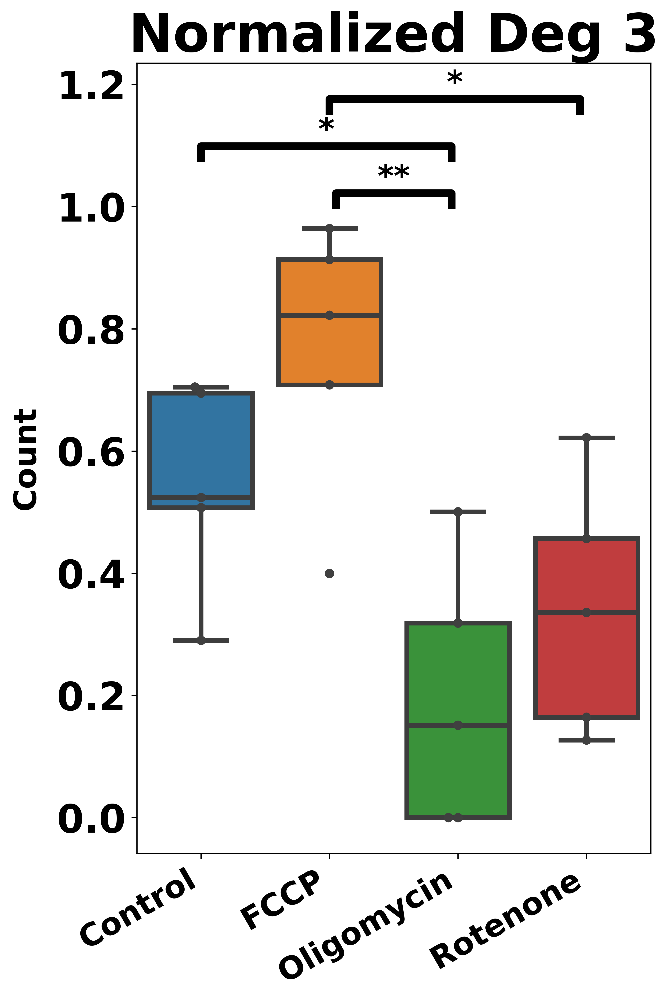

Levena for Average Degree = LeveneResult(statistic=0.08814863129094272, pvalue=0.9655206785938379)
ANOVA for Average Degree = F_onewayResult(statistic=9.512278849311047, pvalue=0.0007639666387413637)


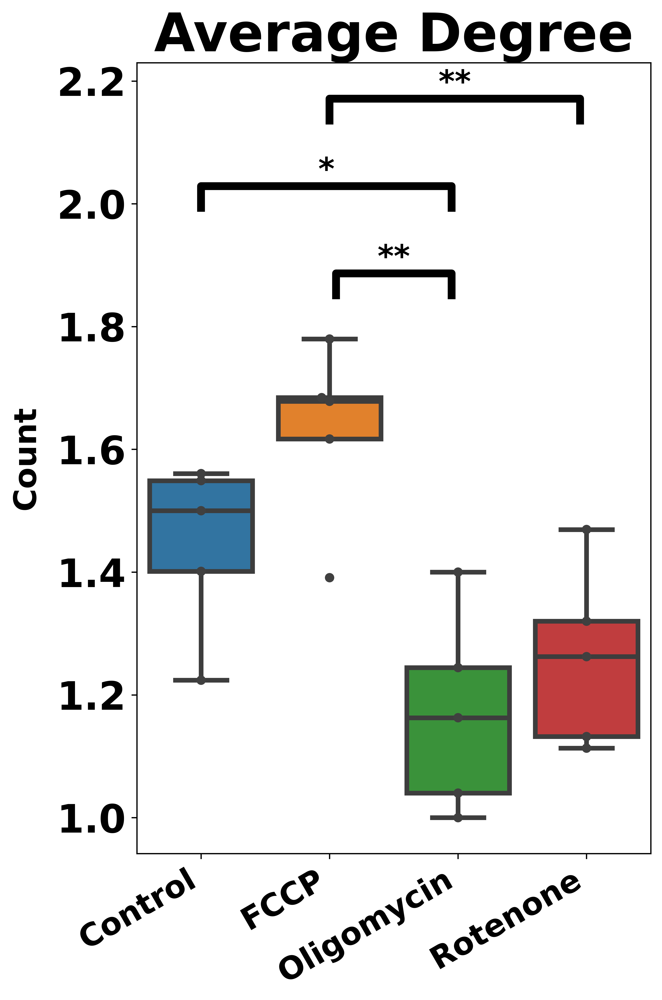

C:\Users\User\anaconda3\envs\main_env\lib\site-packages\numpy\lib\function_base.py:3968: RuntimeWarning: invalid value encountered in multiply
  x2 = take(ap, indices_above, axis=axis) * weights_above
C:\Users\User\anaconda3\envs\main_env\lib\site-packages\scipy\stats\morestats.py:2408: RuntimeWarning: invalid value encountered in subtract
  numer = (Ntot - k) * np.sum(Ni * (Zbari - Zbar)**2, axis=0)
C:\Users\User\anaconda3\envs\main_env\lib\site-packages\scipy\stats\morestats.py:2413: RuntimeWarning: invalid value encountered in subtract
  dvar += np.sum((Zij[i] - Zbari[i])**2, axis=0)
C:\Users\User\anaconda3\envs\main_env\lib\site-packages\scipy\stats\stats.py:3652: RuntimeWarning: invalid value encountered in subtract
  alldata -= offset
C:\Users\User\anaconda3\envs\main_env\lib\site-packages\scipy\stats\stats.py:3660: RuntimeWarning: invalid value encountered in subtract
  ssbn += _square_of_sums(a - offset, axis=axis) / a.shape[axis]
C:\Users\User\anaconda3\envs\main_env\lib\site-

Levena for Deg 1 / Deg 3 = LeveneResult(statistic=nan, pvalue=nan)
ANOVA for Deg 1 / Deg 3 = F_onewayResult(statistic=nan, pvalue=nan)


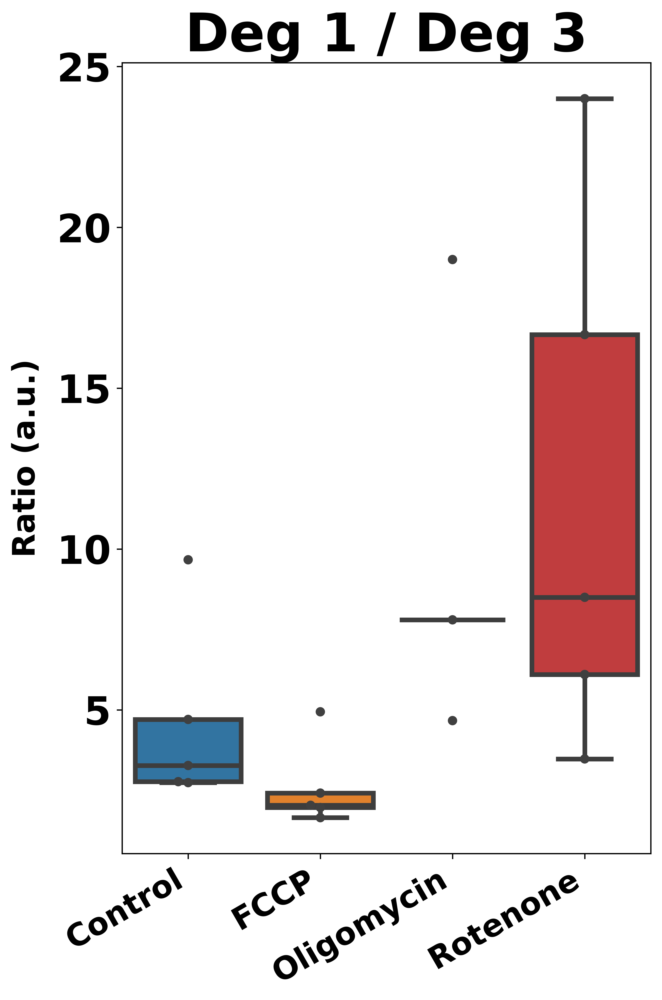

In [17]:
Plot4_seaborn(TotalBranches, 'Total Branches', unit = 'count', group = "skeleton")
Plot4_seaborn(AvgBranches, 'Average Branches', unit = 'count', group = "skeleton")
Plot4_seaborn(ABL, 'Average Branch Length', unit = 'length', group = "skeleton")
Plot4_seaborn(BLpM, 'Branch Length Per Mito', unit = 'length', group = "skeleton")
Plot4_seaborn(TotalDeg1, 'Total Deg 1', unit = 'count', group = "skeleton")
Plot4_seaborn(TotalDeg2, 'Total Deg 2', unit = 'count', group = "skeleton")
Plot4_seaborn(TotalDeg3, 'Total Deg 3', unit = 'count', group = "skeleton")
Plot4_seaborn(AvgDeg1, 'Average Deg 1', unit = 'count', group = "skeleton")
Plot4_seaborn(AvgDeg2, 'Average Deg 2', unit = 'count', group = "skeleton")
Plot4_seaborn(AvgDeg3, 'Average Deg 3', unit = 'count', group = "skeleton")
Plot4_seaborn(nDeg1, 'Normalized Deg 1', unit = 'count', group = "skeleton")
Plot4_seaborn(nDeg2, 'Normalized Deg 2', unit = 'count', group = "skeleton")
Plot4_seaborn(nDeg3, 'Normalized Deg 3',  unit = 'count', group = "skeleton")
Plot4_seaborn(AvgDeg, 'Average Degree', unit = 'count', group = "skeleton")
Plot4_seaborn(Deg1_to_Deg3, "Deg 1 / Deg 3", unit = 'ratio', group = "skeleton")